In [ ]:
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)


Using device: cpu


In [ ]:
!git clone https://github.com/Li-Chongyi/Zero-DCE_extension.git


Cloning into 'Zero-DCE_extension'...
remote: Enumerating objects: 2140, done.
remote: Counting objects: 100% (4/4), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 2140 (delta 0), reused 2 (delta 0), pack-reused 2136 (from 1)
Receiving objects: 100% (2140/2140), 100.92 MiB | 24.36 MiB/s, done.
Resolving deltas: 100% (15/15), done.


In [ ]:
!ls /content/Zero-DCE_extension


README.md  Zero-DCE++


In [ ]:
import sys
sys.path.append("/content/Zero-DCE_extension/Zero-DCE++")

from model import enhance_net_nopool


In [ ]:
import torch

# Initialize model with scale_factor (default in Zero-DCE++ is 1)
model = enhance_net_nopool(scale_factor=1)

# Load pretrained weights
checkpoint_path = "/content/Epoch99.pth"   # adjust if filename is correct
state_dict = torch.load(checkpoint_path, map_location="cpu")
model.load_state_dict(state_dict)

# Set to evaluation mode
model.eval()

print("✅ Pretrained Zero-DCE++ model loaded successfully!")


✅ Pretrained Zero-DCE++ model loaded successfully!


In [ ]:
model = enhance_net_nopool(scale_factor=8).to(device)
model.load_state_dict(torch.load("/content/Epoch99.pth", map_location=device))
model.eval()


enhance_net_nopool(
  (relu): ReLU(inplace=True)
  (upsample): UpsamplingBilinear2d(scale_factor=8.0, mode='bilinear')
  (e_conv1): CSDN_Tem(
    (depth_conv): Conv2d(3, 3, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=3)
    (point_conv): Conv2d(3, 32, kernel_size=(1, 1), stride=(1, 1))
  )
  (e_conv2): CSDN_Tem(
    (depth_conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32)
    (point_conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1))
  )
  (e_conv3): CSDN_Tem(
    (depth_conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32)
    (point_conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1))
  )
  (e_conv4): CSDN_Tem(
    (depth_conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=32)
    (point_conv): Conv2d(32, 32, kernel_size=(1, 1), stride=(1, 1))
  )
  (e_conv5): CSDN_Tem(
    (depth_conv): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), groups=64)
    (po

In [ ]:
import torch

# Initialize model with scale_factor (default in Zero-DCE++ is 1)
model = enhance_net_nopool(scale_factor=1)

# Load pretrained weights
checkpoint_path = "/content/Epoch99.pth"   # adjust if filename is correct
state_dict = torch.load(checkpoint_path, map_location="cpu")
model.load_state_dict(state_dict)

# Set to evaluation mode
model.eval()

print("✅ Pretrained Zero-DCE++ model loaded successfully!")


✅ Pretrained Zero-DCE++ model loaded successfully!


In [ ]:
import cv2
import numpy as np
import torch
from torchvision import transforms
import matplotlib.pyplot as plt

# Image preprocessing
def preprocess_image(img_path):
    img = cv2.imread(img_path)[:, :, ::-1]   # BGR → RGB
    img = cv2.resize(img, (400, 400))
    img = img.astype(np.float32) / 255.0
    img_tensor = torch.from_numpy(img).permute(2, 0, 1)  # CHW
    return img_tensor   # ✅ return ONLY tensor


# Enhancement function
def enhance_image(model, img_path, save_path="enhanced.png"):
    orig_img, img_tensor = preprocess_image(img_path)

    with torch.no_grad():
        enhanced = model(img_tensor)[0]   # forward pass
    enhanced_img = enhanced.permute(1, 2, 0).cpu().numpy()
    enhanced_img = np.clip(enhanced_img, 0, 1)

    # Save enhanced image
    cv2.imwrite(save_path, (enhanced_img[:, :, ::-1] * 255).astype(np.uint8))

    # Show before & after
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.title("Original")
    plt.imshow(orig_img)
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.title("Enhanced")
    plt.imshow(enhanced_img)
    plt.axis("off")
    plt.show()


In [ ]:
import os
print(os.listdir("/content"))


['.config', 'Epoch99.pth', 'Bicycle.zip', 'Zero-DCE_extension', 'sample_data']


In [ ]:
import zipfile
import os

zip_path = "/content/Bicycle.zip"
extract_path = "/content/Bicycle"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

print("✅ Extracted files:", os.listdir(extract_path)[:10])  # show first 10 files


✅ Extracted files: ['2015_00266.jpg', '2015_00012.jpg', '2015_00014.jpg', '2015_00127.jpg', '2015_00135.jpg', '2015_00138.jpg', '2015_00566.jpg', '2015_00518.jpg', '2015_00440.JPEG', '2015_00497.jpg']


In [ ]:
import os

bicycle_files = os.listdir("/content/Bicycle")
print(bicycle_files[:20])  # first 20 files


['2015_00266.jpg', '2015_00012.jpg', '2015_00014.jpg', '2015_00127.jpg', '2015_00135.jpg', '2015_00138.jpg', '2015_00566.jpg', '2015_00518.jpg', '2015_00440.JPEG', '2015_00497.jpg', '2015_00221.jpg', '2015_00378.jpg', '2015_00334.jpg', '2015_00150.jpg', '2015_00063.jpg', '2015_00428.jpg', '2015_00018.jpg', '2015_00263.jpg', '2015_00599.jpg', '2015_00390.jpg']


In [ ]:
def enhance_image(model, img_path, save_path=None):
    # Preprocess
    img_tensor = preprocess_image(img_path).unsqueeze(0).to(device)  # [1, C, H, W]

    with torch.no_grad():
        output = model(img_tensor)

        # Some Zero-DCE++ models return a list of enhancement stages
        if isinstance(output, (list, tuple)):
            enhanced = output[0]   # take the first stage
        else:
            enhanced = output

    # If still batched, remove batch dim
    if enhanced.dim() == 4:
        enhanced = enhanced[0]    # -> [C, H, W]

    # Convert to numpy
    enhanced_img = enhanced.permute(1, 2, 0).cpu().numpy()
    enhanced_img = np.clip(enhanced_img, 0, 1)

    if save_path:
        plt.imsave(save_path, enhanced_img)

    return enhanced_img


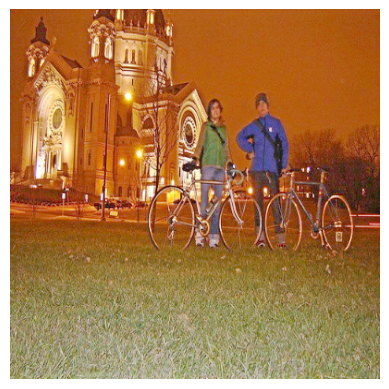

In [ ]:
img_path = "/content/Bicycle/2015_00009.jpg"
enhanced_img = enhance_image(model, img_path, save_path="enhanced_00009.png")

plt.imshow(enhanced_img)
plt.axis("off")
plt.show()


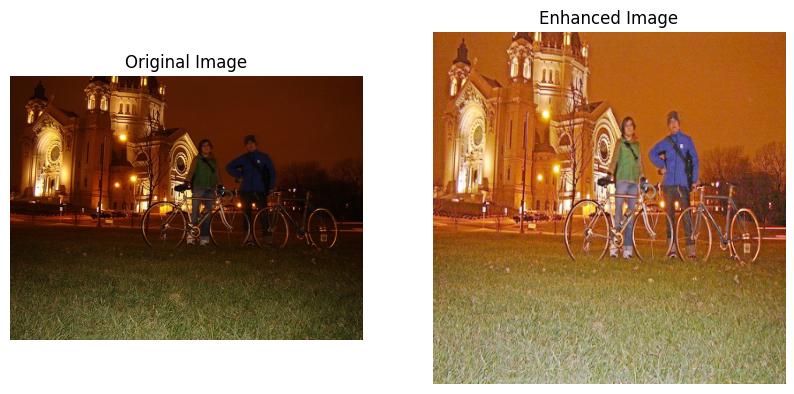

In [ ]:
import matplotlib.pyplot as plt

# Original image
orig_img = cv2.imread(img_path)[:, :, ::-1]  # BGR → RGB

# Enhanced image
enhanced_img = enhance_image(model, img_path, save_path="enhanced_00009.png")

# Show both side by side
plt.figure(figsize=(10,5))

plt.subplot(1,2,1)
plt.title("Original Image")
plt.imshow(orig_img)
plt.axis("off")

plt.subplot(1,2,2)
plt.title("Enhanced Image")
plt.imshow(enhanced_img)
plt.axis("off")

plt.show()


In [ ]:
!pip install scikit-image image-quality


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 170.6/170.6 kB 5.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 146.6/146.6 kB 8.8 MB/s eta 0:00:00
  Created wheel for libsvm: filename=libsvm-3.23.0.4-cp312-cp312-linux_x86_64.whl size=251418 sha256=49183efe408e3414e95c743705467804dc2e5629a59a82689b74dfd2e5da621c
  Stored in directory: /root/.cache/pip/wheels/3e/41/29/219cda9dd4f382777661816e4b9215c10ffe5d07dad2bc9401
Successfully built libsvm


In [ ]:
!pip install piq

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.9/106.9 kB 4.0 MB/s eta 0:00:00


In [ ]:
!pip install image-quality


In [ ]:
!pip install -U scikit-image


In [ ]:
!pip install scikit-video


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 15.1 MB/s eta 0:00:00


In [ ]:
import cv2
import numpy as np
import scipy
import types

# --- Patch numpy for old 'np.int' ---
if not hasattr(np, "int"):
    np.int = int  # redirect deprecated np.int to built-in int

# --- Patch scipy.misc.imresize ---
def imresize_patch(img, scale, interp='bicubic', mode='F'):
    h, w = img.shape[:2]
    new_h, new_w = int(h * scale), int(w * scale)
    if interp == 'bicubic':
        interp_flag = cv2.INTER_CUBIC
    else:
        interp_flag = cv2.INTER_LINEAR
    resized = cv2.resize(img, (new_w, new_h), interpolation=interp_flag)
    return resized.astype(np.float32)

if not hasattr(scipy, "misc"):
    scipy.misc = types.SimpleNamespace()
scipy.misc.imresize = imresize_patch

# --- Import NIQE ---
from skvideo.measure import niqe as skv_niqe

# --- Load images ---
orig_path = "/content/Bicycle/2015_00009.jpg"
enh_path  = "enhanced_00009.png"

orig = cv2.imread(orig_path, cv2.IMREAD_GRAYSCALE).astype(np.float32)
enh  = cv2.imread(enh_path, cv2.IMREAD_GRAYSCALE).astype(np.float32)

# Match sizes
orig = cv2.resize(orig, (enh.shape[1], enh.shape[0]))

# --- Compute NIQE ---
niqe_orig = skv_niqe(orig)
niqe_enh  = skv_niqe(enh)

print("NIQE – Original:", niqe_orig)
print("NIQE – Enhanced:", niqe_enh)


NIQE – Original: [14.047812]
NIQE – Enhanced: [15.7998295]


In [ ]:
!git clone https://github.com/VITA-Group/EnlightenGAN.git
%cd EnlightenGAN


Cloning into 'EnlightenGAN'...
remote: Enumerating objects: 606, done.
remote: Counting objects: 100% (415/415), done.
remote: Compressing objects: 100% (45/45), done.
remote: Total 606 (delta 390), reused 370 (delta 370), pack-reused 191 (from 1)
Receiving objects: 100% (606/606), 17.88 MiB | 12.01 MiB/s, done.
Resolving deltas: 100% (443/443), done.
/content/EnlightenGAN


Using device: cpu
[1/30] Saved: /content/enhanced_images/enhanced_00001.png


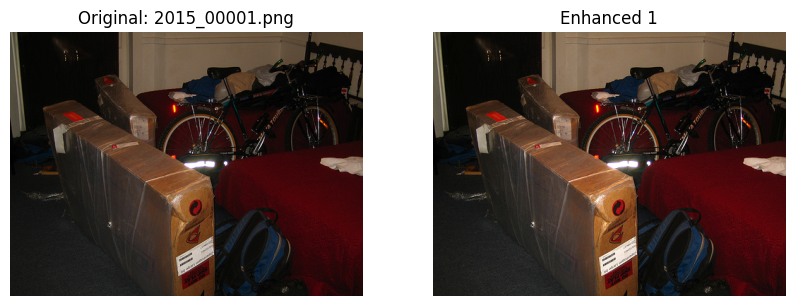

[2/30] Saved: /content/enhanced_images/enhanced_00002.png


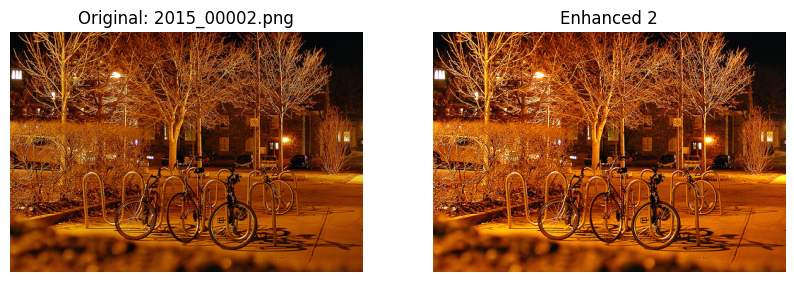

[3/30] Saved: /content/enhanced_images/enhanced_00003.png


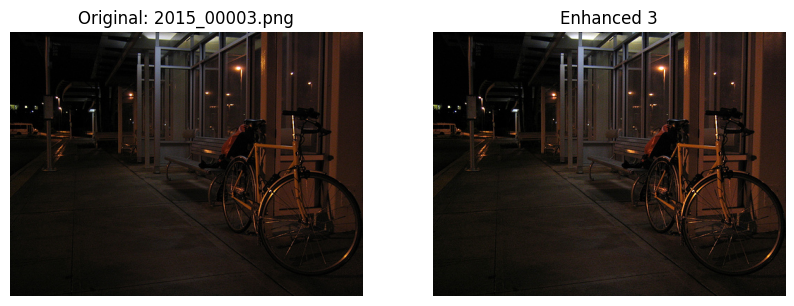

[4/30] Saved: /content/enhanced_images/enhanced_00004.png


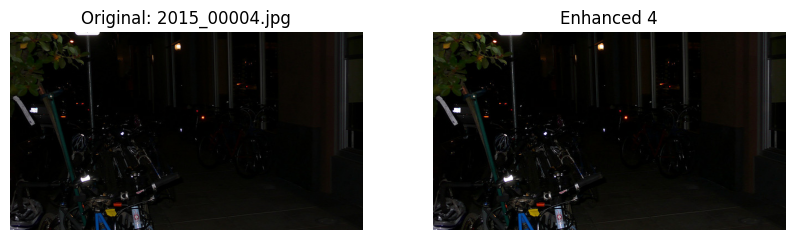

[5/30] Saved: /content/enhanced_images/enhanced_00005.png


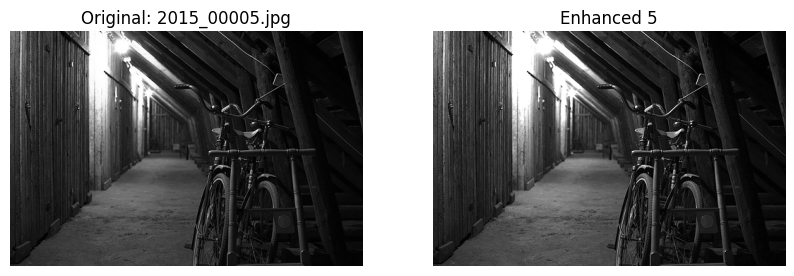

[6/30] Saved: /content/enhanced_images/enhanced_00006.png


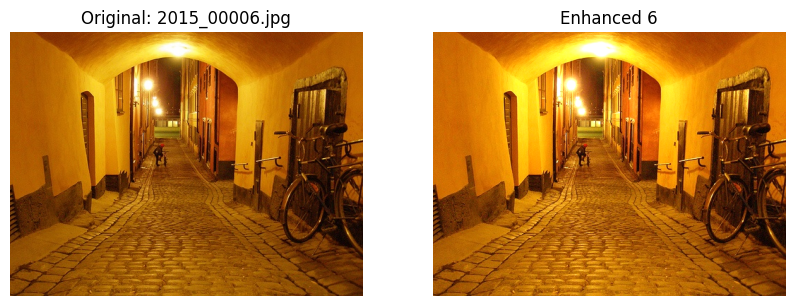

[7/30] Saved: /content/enhanced_images/enhanced_00007.png


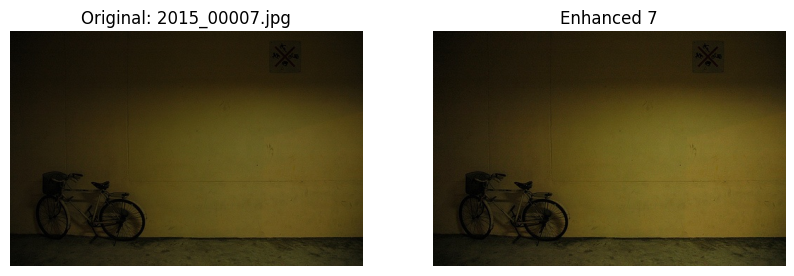

[8/30] Saved: /content/enhanced_images/enhanced_00008.png


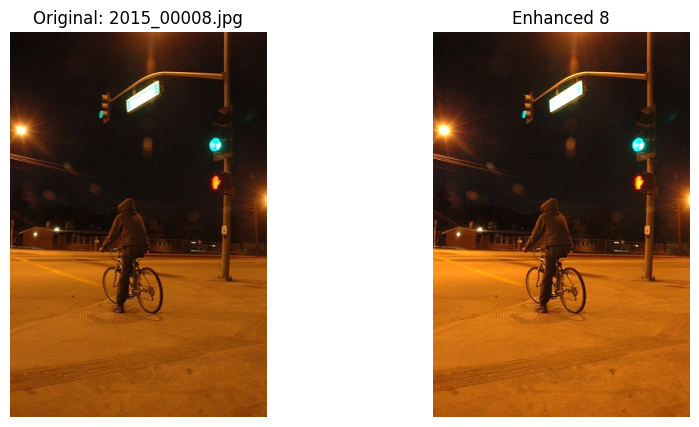

[9/30] Saved: /content/enhanced_images/enhanced_00009.png


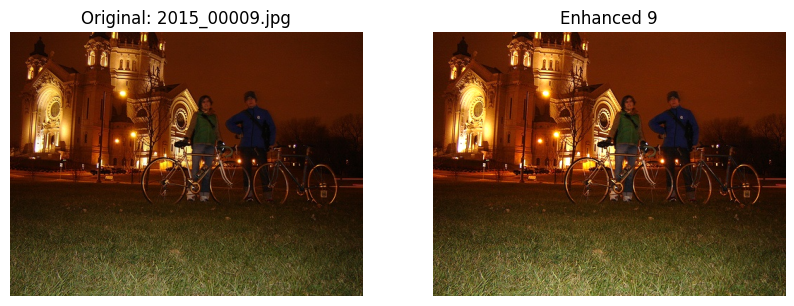

[10/30] Saved: /content/enhanced_images/enhanced_00010.png


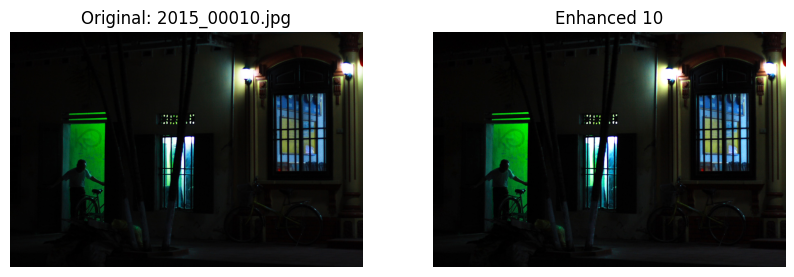

[11/30] Saved: /content/enhanced_images/enhanced_00011.png


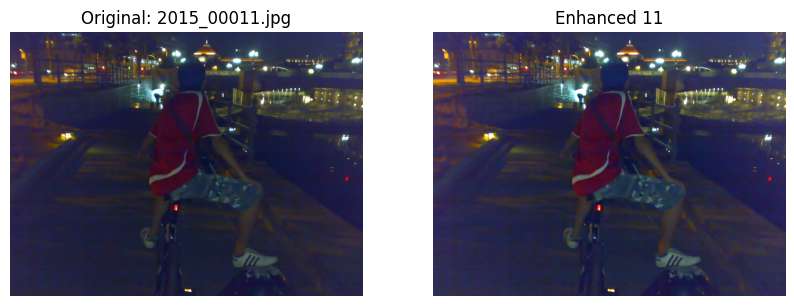

[12/30] Saved: /content/enhanced_images/enhanced_00012.png


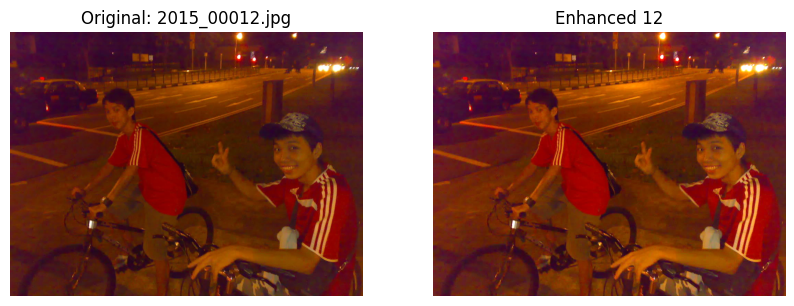

[13/30] Saved: /content/enhanced_images/enhanced_00013.png


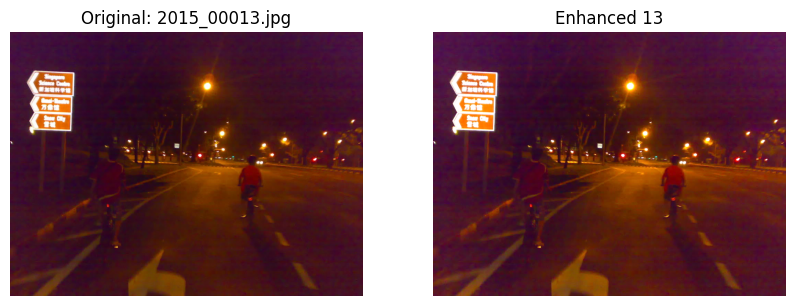

[14/30] Saved: /content/enhanced_images/enhanced_00014.png


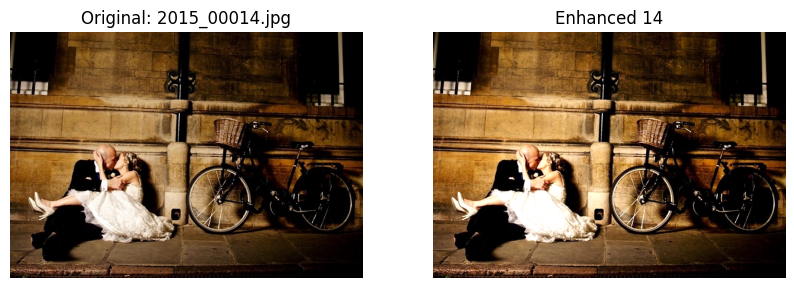

[15/30] Saved: /content/enhanced_images/enhanced_00015.png


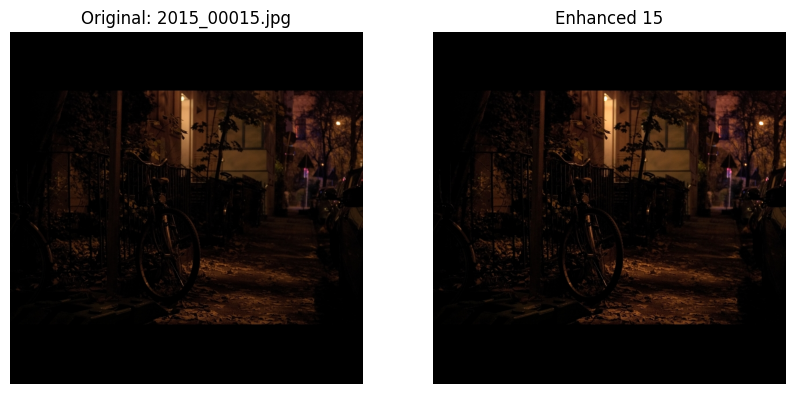

[16/30] Saved: /content/enhanced_images/enhanced_00016.png


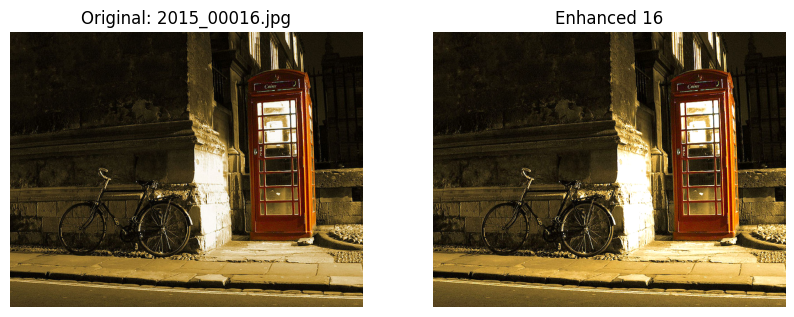

[17/30] Saved: /content/enhanced_images/enhanced_00017.png


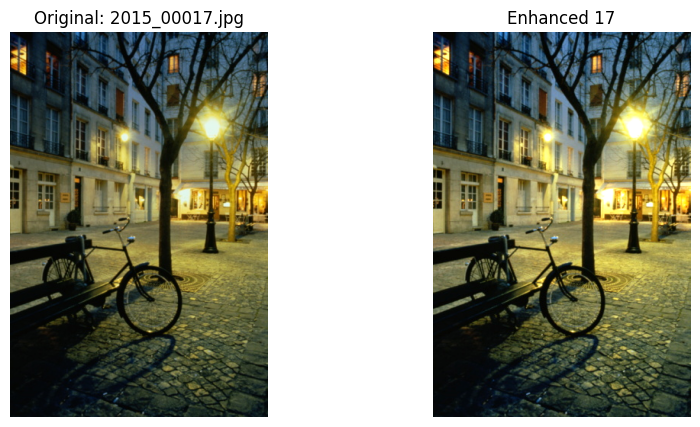

[18/30] Saved: /content/enhanced_images/enhanced_00018.png


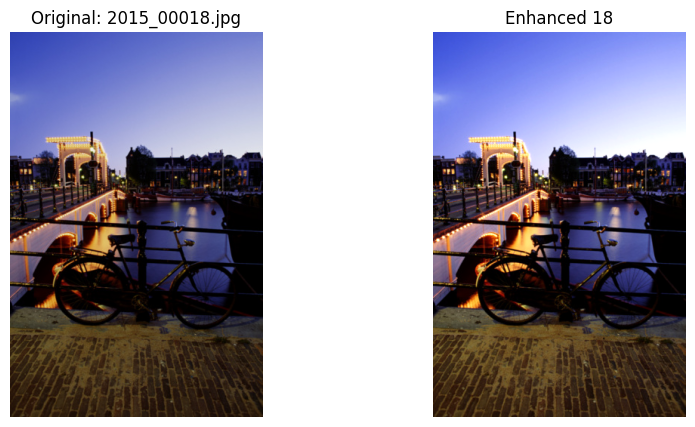

[19/30] Saved: /content/enhanced_images/enhanced_00019.png


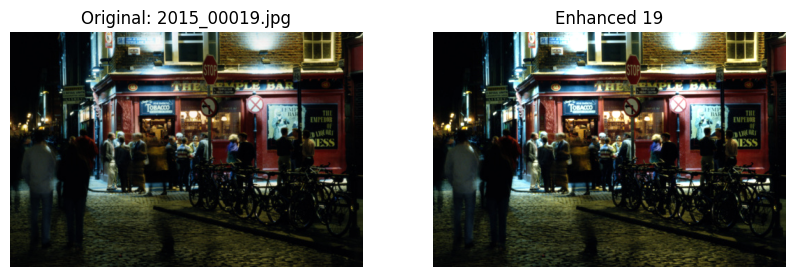

[20/30] Saved: /content/enhanced_images/enhanced_00020.png


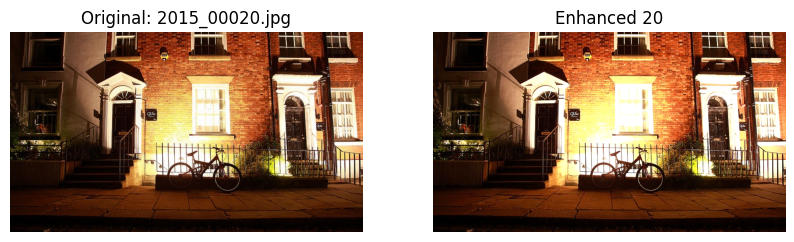

[21/30] Saved: /content/enhanced_images/enhanced_00021.png


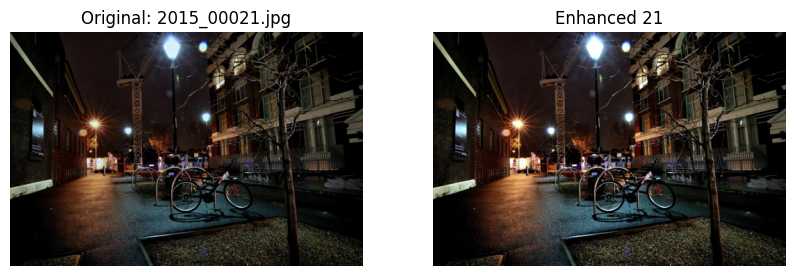

[22/30] Saved: /content/enhanced_images/enhanced_00022.png


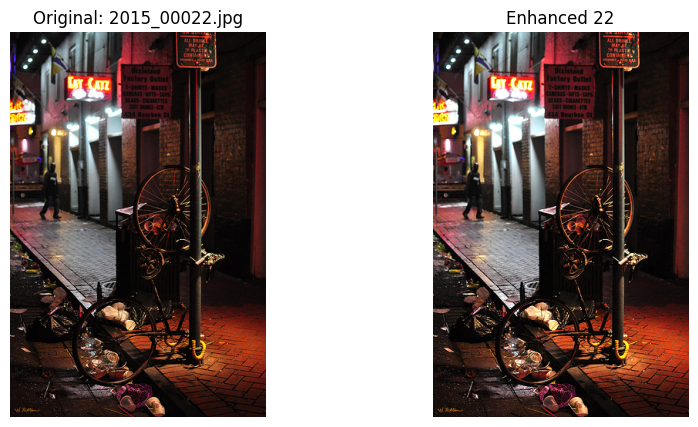

[23/30] Saved: /content/enhanced_images/enhanced_00023.png


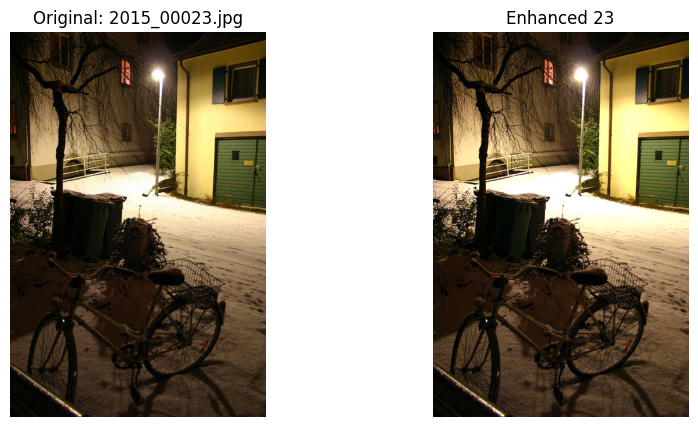

[24/30] Saved: /content/enhanced_images/enhanced_00024.png


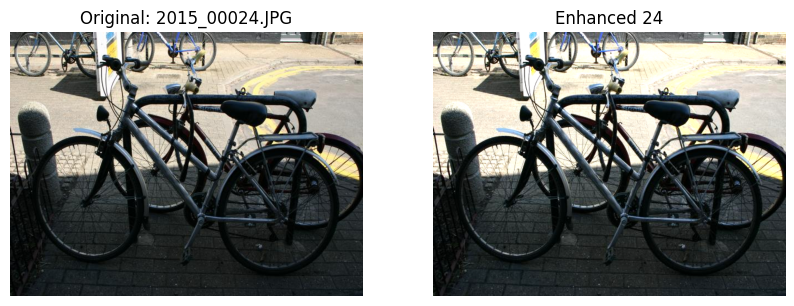

[25/30] Saved: /content/enhanced_images/enhanced_00025.png


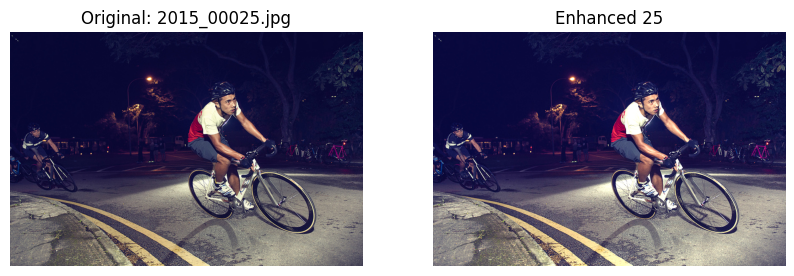

[26/30] Saved: /content/enhanced_images/enhanced_00026.png


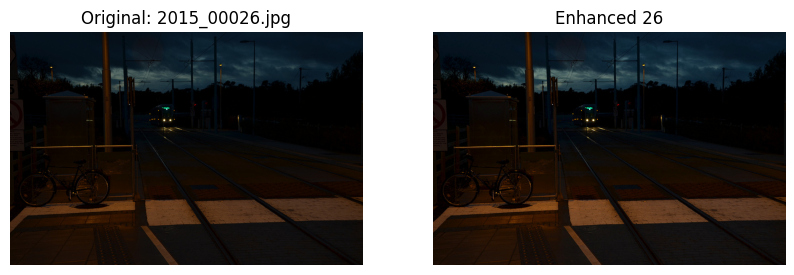

[27/30] Saved: /content/enhanced_images/enhanced_00027.png


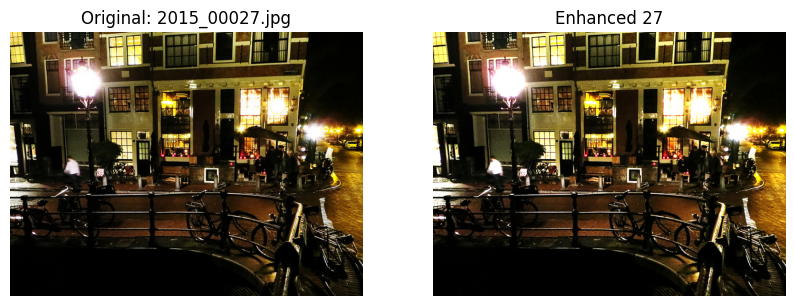

[28/30] Saved: /content/enhanced_images/enhanced_00028.png


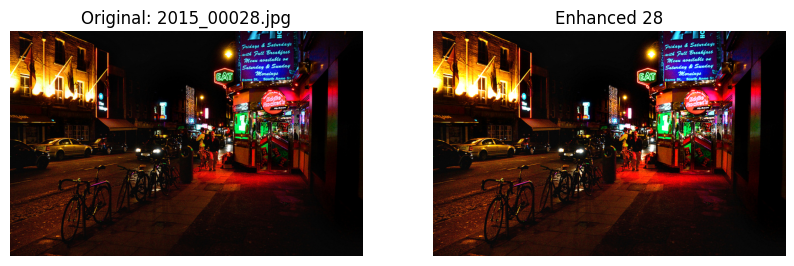

[29/30] Saved: /content/enhanced_images/enhanced_00029.png


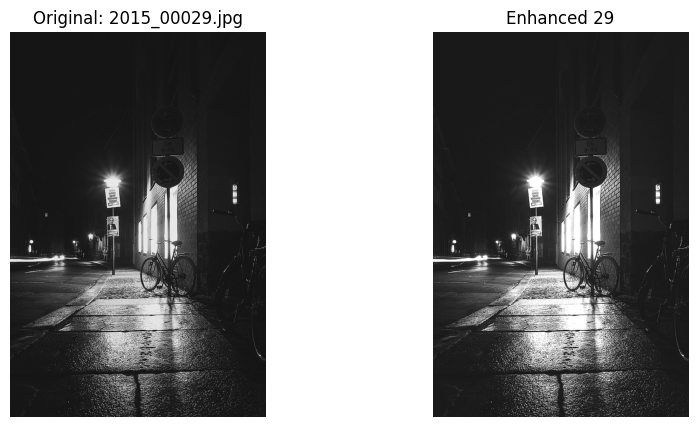

[30/30] Saved: /content/enhanced_images/enhanced_00030.png


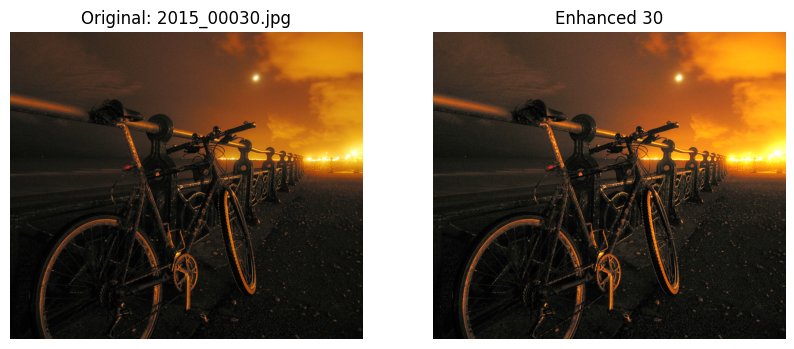

✅ Done! Enhanced and displayed 30 images.


In [ ]:
import os
import cv2
import torch
from torchvision import transforms
from PIL import Image
import matplotlib.pyplot as plt

# ==== CONFIG ====
input_dir = "/content/Bicycle"
output_dir = "/content/enhanced_images"
num_images = 30   # enhance first 30 images

os.makedirs(output_dir, exist_ok=True)

# Device setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Preprocessing
transform = transforms.Compose([
    transforms.ToTensor()
])

# Dummy example model (replace with your actual model, e.g. RetinexNet)
class DummyEnhancer(torch.nn.Module):
    def forward(self, x):
        return torch.clamp(x * 1.2, 0, 1)  # brighten slightly

model = DummyEnhancer().to(device)
model.eval()

# ==== ENHANCE & DISPLAY ====
files = sorted(os.listdir(input_dir))[:num_images]

for idx, filename in enumerate(files):
    img_path = os.path.join(input_dir, filename)
    img = Image.open(img_path).convert("RGB")

    # Preprocess
    img_tensor = transform(img).unsqueeze(0).to(device)

    # Forward pass
    with torch.no_grad():
        enhanced = model(img_tensor)

    # Convert back to numpy
    enhanced_img = enhanced.squeeze(0).cpu().numpy().transpose(1, 2, 0) * 255
    enhanced_img = enhanced_img.astype("uint8")

    # Save
    save_path = os.path.join(output_dir, f"enhanced_{idx+1:05d}.png")
    cv2.imwrite(save_path, cv2.cvtColor(enhanced_img, cv2.COLOR_RGB2BGR))

    print(f"[{idx+1}/{num_images}] Saved: {save_path}")

    # ==== SHOW SIDE BY SIDE ====
    plt.figure(figsize=(10, 5))

    # Original
    plt.subplot(1, 2, 1)
    plt.imshow(img)
    plt.title(f"Original: {filename}")
    plt.axis("off")

    # Enhanced
    plt.subplot(1, 2, 2)
    plt.imshow(enhanced_img)
    plt.title(f"Enhanced {idx+1}")
    plt.axis("off")

    plt.show()

print("✅ Done! Enhanced and displayed 30 images.")


In [ ]:
import matplotlib.pyplot as plt
import cv2
import os

# Get the list of bicycle files
bicycle_files = os.listdir("/content/Bicycle")

# Display original and enhanced images for the first 30 files
num_images_to_display = 30

for i, filename in enumerate(bicycle_files[:num_images_to_display]):
    orig_img_path = os.path.join("/content/Bicycle", filename)
    enhanced_img_path = os.path.join("/content/enhanced_images", f"enhanced_{filename}")

    # Load original and enhanced images
    orig_img = cv2.imread(orig_img_path)[:, :, ::-1] # BGR to RGB

    # Check if enhanced image exists before loading
    if os.path.exists(enhanced_img_path):
        enhanced_img = cv2.imread(enhanced_img_path)[:, :, ::-1] # BGR to RGB
    else:
        print(f"Warning: Enhanced image not found for {filename}. Skipping display.")
        continue # Skip to the next image if enhanced image is not found


    # Display side by side
    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.title(f"Original: {filename}")
    plt.imshow(orig_img)
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.title(f"Enhanced: enhanced_{filename}")
    plt.imshow(enhanced_img)
    plt.axis("off")

    plt.show()

In [ ]:
!pip install ultralytics


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 29.2 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO

# Load YOLOv8 pretrained model (you can also use 'yolov8m.pt' or 'yolov8l.pt' for better accuracy)
yolo_model = YOLO("yolov8x.pt")  # 'x' = extra large, more accurate (perfect mode)

In [ ]:
import ultralytics
print(ultralytics.__version__)


8.3.204


In [ ]:
# Run object detection on enhanced image
results = yolo_model.predict(
    source="/content/enhanced_images",  # Path to enhanced image
    conf=0.5,                    # Confidence threshold (higher = more strict)
    save=True,                   # Save results with bounding boxes
    show=True,                   # Show image window (only works locally)
    classes=None                 # Detect all classes, or filter with e.g. [0] for person
)


image 1/30 /content/enhanced_images/enhanced_00001.png: 480x640 1 bicycle, 1 backpack, 1 bed, 4060.5ms
image 2/30 /content/enhanced_images/enhanced_00002.png: 448x640 4 bicycles, 4 cars, 4737.1ms
image 3/30 /content/enhanced_images/enhanced_00003.png: 480x640 1 bicycle, 1 bus, 3992.4ms
image 4/30 /content/enhanced_images/enhanced_00004.png: 384x640 2 bicycles, 3060.4ms
image 5/30 /content/enhanced_images/enhanced_00005.png: 448x640 1 bicycle, 3654.3ms
image 6/30 /content/enhanced_images/enhanced_00006.png: 480x640 1 bicycle, 4922.8ms
image 7/30 /content/enhanced_images/enhanced_00007.png: 448x640 1 bicycle, 3569.3ms
image 8/30 /content/enhanced_images/enhanced_00008.png: 640x448 1 person, 1 bicycle, 1 traffic light, 3608.9ms
image 9/30 /content/enhanced_images/enhanced_00009.png: 480x640 2 persons, 2 bicycles, 5013.0ms
image 10/30 /content/enhanced_images/enhanced_00010.png: 448x640 1 person, 2 bicycles, 3556.6ms
image 11/30 /content/enhanced_images/enhanced_00011.png: 480x640 1 perso